# **Task 2: Transfer Learning on Landmarks Dataset (70 points)**

# **Dataset Description**

The dataset consists of a collection of images about famous (or not so famous) landmarks. The collection is organized into a two-level hierarchy structure. The first level is the categories for the landmarks, and the second level is the individual landmarks. There are 6 categories and the categories are

1. Gothic
2. Modern
3. Mughal
4. Neoclassical
5. Pagodas
6. Pyramids

For each category there are 5 landmarks for a total of 30 landmarks.

# **Instructions**

Similar to task 1, you will be performing transfer learning to do classification. For task 2 you will be using the Landmarks datasets to predict the category names of the landmark images. The landmarks dataset is too small to train convolutional neural networks (CNNs) from scratch.

The resulting network will overfit the data. Instead use transfer learning by reusing part of a pre-trained CNN. In transfer learning, instead of training the neural network starting from random weights, the weights for the lower parts of the network are taken from a pre-trained network. Only the higher parts of the network will have to be learned. For this group project, the only allowed pretrained network is VGG16, which is a smaller CNN.

# **Objective**

The objective of this restriction is to avoid penalizing groups that do not have access to powerfulmachines and/or machines with GPUs. Groups are allowed to use Google Colab with GPUs to train the models, but be aware there are resource usage limitations.

# **Hint**

# **Data Augmentation**

Data Augmentation is another way to overcome the problem of small datasets. Keras/TensorFlow provides a variety of image manipulation functions (https://www.tensorflow.org/api_docs/python/tf/image) that can be used to generate additional images.

# **Goal**

To achieve optimal F1 score and precision values.

# **Implementation using VGG16 Model**

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [7]:
!pip install ipython-autotime
!pip install pillow-avif-plugin
!pip install tensorflow-addons

%load_ext autotime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 49.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 8.4 MB/s eta 0:00:00:00:010:01
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.1.5
    Uninstalling typeguard-4.1.5:
      Successfully uninstalled typeguard-4.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.
ydata-profiling 4.6.4 requires typeguard<5,>=4.1.2, but you have typeguard 2.13.3 which is incompatible.
time: 351 µs (started: 2024-05-06 14:26:01 +00:00)


In [8]:
import random
import os

import warnings
warnings.simplefilter("ignore")

from pprint import pprint

import matplotlib.pyplot as plt
import seaborn as sns

import PIL
import PIL.Image
import pillow_avif

import cv2

import pandas as pd
import numpy as np

from tqdm import tqdm

from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
import joblib

import tensorflow
import tensorflow as tf
import tensorflow_hub as hub
# import tensorflow_addons as tfa

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

2024-05-06 14:26:03.183722: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-06 14:26:03.183821: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-06 14:26:03.307107: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


time: 12.9 s (started: 2024-05-06 14:26:01 +00:00)


In [9]:
tf.__version__

'2.15.0'

time: 4.42 ms (started: 2024-05-06 14:26:13 +00:00)


In [4]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1
time: 1.65 ms (started: 2024-05-05 19:13:30 +00:00)


In [5]:
METADATA_PATH = "/kaggle/input/landmarks-data/landmarks_data.csv"

time: 9.14 ms (started: 2024-05-05 19:13:30 +00:00)


In [6]:
df = pd.read_csv(METADATA_PATH)
df.sort_values(
    by=['category', 'landmark', "img_path"], 
    inplace=True, 
    ignore_index=True
)
df = df[["category","landmark","img_path"]]
df.head()

,category,landmark,img_path
0,Gothic,ChartresCathedral,/kaggle/input/landmarks-dataset/Landmarks/Goth...
1,Gothic,ChartresCathedral,/kaggle/input/landmarks-dataset/Landmarks/Goth...
2,Gothic,ChartresCathedral,/kaggle/input/landmarks-dataset/Landmarks/Goth...
3,Gothic,ChartresCathedral,/kaggle/input/landmarks-dataset/Landmarks/Goth...
4,Gothic,ChartresCathedral,/kaggle/input/landmarks-dataset/Landmarks/Goth...


time: 24.3 ms (started: 2024-05-05 19:13:30 +00:00)


In [7]:
img_height = 224
img_width = 224

time: 312 µs (started: 2024-05-05 19:13:30 +00:00)


In [8]:
def read_imgs(path_to_image):
    image = PIL.Image.open(path_to_image).convert("RGB")
    image = np.asarray(image.resize((img_height, img_width)))
    return image

time: 4.58 ms (started: 2024-05-05 19:13:30 +00:00)


In [9]:
lb_category = LabelBinarizer()
category_enc = lb_category.fit(df["category"])
y_category = lb_category.transform(df["category"])

with open("category_encoder.pkl", "wb") as f:
    joblib.dump(category_enc, f)

# Labels
print('Category classes:')
pd.DataFrame(
    zip(
        lb_category.classes_, np.unique(np.argmax(y_category, axis = 1))
    ), 
    columns = ["category_name", "label"]
)

Category classes:


,category_name,label
0,Gothic,0
1,Modern,1
2,Mughal,2
3,Neoclassical,3
4,Pagodas,4
5,Pyramids,5


time: 13.8 ms (started: 2024-05-05 19:13:30 +00:00)


In [10]:
lb_landmark = LabelBinarizer()
landmark_enc = lb_landmark.fit(df["landmark"])
y_landmark = lb_landmark.transform(df["landmark"])

with open("landmark_encoder.pkl", "wb") as f:
    joblib.dump(landmark_enc, f)
    
# Labels
print('Landmark classes:')
pd.DataFrame(
    zip(
        lb_landmark.classes_, np.unique(np.argmax(y_landmark, axis = 1))
    ), 
    columns = ["landmark_name", "label"]
)

Landmark classes:


,landmark_name,label
0,Academy of Athens,0
1,Bibi Ka Maqbara,1
2,Buckingham Palace,2
3,CCTV Headquarters,3
4,Cathedral of Brasília,4
5,ChartresCathedral,5
6,Chrysler Building,6
7,CologneCathedral,7
8,Concertgebouw,8
9,"El Castillo, Chichen Itza",9


time: 13.5 ms (started: 2024-05-05 19:13:30 +00:00)


In [11]:
from sklearn.model_selection import train_test_split
import numpy as np

# Set the random seed for reproducibility
np.random.seed(42)

# Train and Test Split
train, test = train_test_split(
    df, test_size=0.1, shuffle=True, random_state=42, stratify=df[['category', 'landmark']]
)

# Train and Validation Split
train, val = train_test_split(
    train, test_size=0.2, stratify=train[['category', 'landmark']], random_state=42
)

train_x, cat_y_train, land_y_train = train["img_path"], train["category"], train["landmark"]
val_x, cat_y_val, land_y_val = val["img_path"], val["category"], val["landmark"]
test_x, cat_y_test, land_y_test = test["img_path"], test["category"], test["landmark"]

# Reading Images
train_x = np.array([read_imgs(i) for i in tqdm(train_x)])
val_x = np.array([read_imgs(i) for i in tqdm(val_x)])
test_x = np.array([read_imgs(i) for i in tqdm(test_x)])

# Encoding Labels
cat_y_train, land_y_train = lb_category.transform(cat_y_train), lb_landmark.transform(land_y_train)
cat_y_val, land_y_val = lb_category.transform(cat_y_val), lb_landmark.transform(land_y_val)
cat_y_test, land_y_test = lb_category.transform(cat_y_test), lb_landmark.transform(land_y_test)

# Scale the images
train_x, val_x, test_x = np.array(train_x) / 255.0, np.array(val_x) / 255.0, np.array(test_x) / 255.0

# Shapes and size of dataset
train_x.shape, val_x.shape, test_x.shape


100%|██████████| 42/42 [00:01<00:00, 41.76it/s]


((302, 224, 224, 3), (76, 224, 224, 3), (42, 224, 224, 3))

time: 15.5 s (started: 2024-05-05 19:13:30 +00:00)


In [12]:
AUTO = tf.data.experimental.AUTOTUNE
BATCH_SIZE = 16 * strategy.num_replicas_in_sync

if tpu is None:
    BATCH_SIZE = BATCH_SIZE * 2

time: 703 µs (started: 2024-05-05 19:13:45 +00:00)


In [13]:
train_dataset = (
    tf.data.Dataset
    .from_tensor_slices(
        (train_x, cat_y_train, land_y_train)
    )
    .map(
        lambda image, category, landmark: (
            image, {"category": category, "landmark": landmark}
        )
    )
    .repeat()
    .shuffle(16)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices(
        (val_x, cat_y_val, land_y_val)
    )
    .map(
        lambda image, category, landmark: (
            image, {"category": category, "landmark": landmark}
        )
    )
    .repeat()
    .shuffle(8)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(
        (test_x, cat_y_test ,land_y_test)
    )
    .map(
        lambda image, category, landmark: (
            image, {"category": category, "landmark": landmark}
        )
    )
    .batch(BATCH_SIZE)
    .cache()
    .prefetch(AUTO)
)

time: 1.67 s (started: 2024-05-05 19:13:45 +00:00)


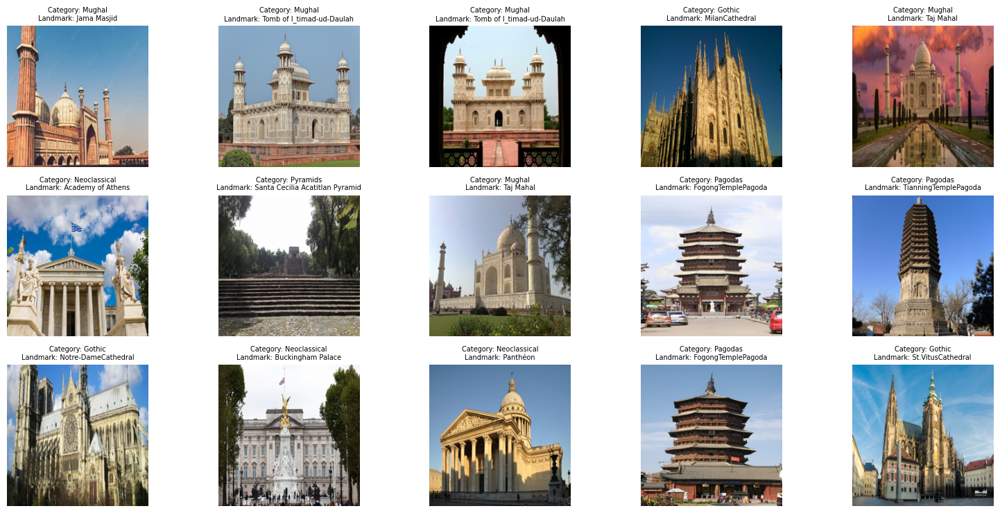

time: 2.13 s (started: 2024-05-05 19:13:47 +00:00)


In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(19, 9))
for images, labels in train_dataset.take(1):
    for i in range(15):
        ax = plt.subplot(3, 5, i + 1)
        plt.imshow(images[i].numpy())
        
        cat_ = lb_category.classes_[np.argmax(labels["category"][i])]
        land_ = lb_landmark.classes_[np.argmax(labels["landmark"][i])]
        
        plt.title(f"Category: {cat_}\nLandmark: {land_}", fontdict={"fontsize":7})
        plt.axis("off")

In [15]:
INPUT_SHAPE = (224, 224, 3)

NUM_CATEGORY_CLASSES = 6
NUM_LANDMARK_CLASSES = 30

EPOCHS = 50
TRAIN_STEPS = train_x.shape[0] // BATCH_SIZE
VALIDATION_STEPS = val_x.shape[0] // BATCH_SIZE

time: 853 µs (started: 2024-05-05 19:13:49 +00:00)


In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers

img_augmentation = Sequential(
    [
        layers.RandomRotation(factor=0.2),
        layers.RandomBrightness(factor=0.45, value_range=(0, 1)),
        layers.RandomFlip(mode="horizontal"),
        layers.RandomZoom(0.2, 0.2),
        layers.RandomContrast(factor=0.3),
        layers.RandomHeight(0.2),
        layers.RandomWidth(0.2),
    ],
    name="image_augmentation",
)

time: 22.6 ms (started: 2024-05-05 19:13:49 +00:00)


In [17]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16


def build_model(input_shape, num_category_classes, num_landmark_classes): 
    inputs = layers.Input(shape=input_shape)
    img_aug = img_augmentation(inputs)
    
    vgg = VGG16(
        include_top=False,
        weights='imagenet',
        input_tensor=img_aug,
        input_shape=input_shape,
        pooling=None,
        classes=None,
    )
    
    vgg.trainable = False
    
    
    # Fine tuning
    x = tf.keras.layers.GlobalAveragePooling2D()(vgg.output)
    mod = layers.Dense(1024, activation='swish')(x)
    mod = layers.Dropout(0.3, name="top_dropout")(mod)
    
    # Category Branch
    cat = layers.Dense(128, activation='swish')(mod)
    cat = layers.BatchNormalization()(cat)
    cat = layers.Dropout(0.5)(cat)
    cat = layers.Dense(
        num_category_classes, activation="softmax", name="category"
    )(cat)
    
    # Landmark Branch
    land = layers.Dense(128, activation='swish')(mod)
    land = layers.BatchNormalization()(land)
    land = layers.Dropout(0.5)(land)
    land = layers.Dense(
        num_landmark_classes, activation="softmax", name="landmark"
    )(land)
    
    # Fit the inputs and outputs from all branches
    model = Model(inputs=inputs, outputs=[cat, land], name="VGG16_Model")
    
    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), 
        loss_weights={
            'category': 1.0,
            'landmark': 1.0
        },
        loss={
            'category': 'categorical_crossentropy',
            'landmark': 'categorical_crossentropy'
        },  
        metrics={
            'category': 'accuracy',
            'landmark': 'accuracy',
            'category': tf.keras.metrics.F1Score(),
            'landmark': tf.keras.metrics.F1Score()
        }
    )
    return model

# Now call the function by passing the input shape
input_shape = (224, 224, 3)  # Example input shape, adjust according to your data
model = build_model(input_shape, NUM_CATEGORY_CLASSES, NUM_LANDMARK_CLASSES)

time: 397 ms (started: 2024-05-05 19:13:49 +00:00)


# **MODEL SUMMARY**

In [18]:
# Clear backend sessions to reset name counters
tf.keras.backend.clear_session()

input_shape = (224, 224, 3)  # Example input shape, adjust according to your data

with strategy.scope():
    model = build_model(input_shape, NUM_CATEGORY_CLASSES, NUM_LANDMARK_CLASSES)
    
model.summary()

Model: "VGG16_Model"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_augmentation  │ (None, None,      │          0 │ input_layer[0][0] │
│ (Sequential)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, None,      │      1,792 │ image_augmentati… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, None,      │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, None,      │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, None,      │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, None,      │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, None,      │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, None,      │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, None,      │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, None,      │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, None,      │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, None,      │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, None,      │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, None,      │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, None,      │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ None, 512)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, None,      │  2,359,808 │ block4_pool[0][0

 Total params: 15,508,068 (59.16 MB)

 Trainable params: 792,868 (3.02 MB)

 Non-trainable params: 14,715,200 (56.13 MB)

time: 649 ms (started: 2024-05-05 19:13:49 +00:00)


# **MODEL ARCHITECTURE**

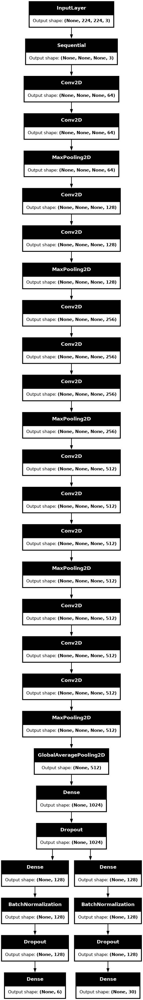

time: 206 ms (started: 2024-05-05 19:13:50 +00:00)


In [19]:
tf.keras.utils.plot_model(model, to_file="category_and_landmark_classifier.png", show_shapes=True, dpi=75)

In [42]:
# Define callbacks for saving both best models
checkpoint_loss = ModelCheckpoint(
    'saved_model/cat_land_best_model_loss.keras', 
    save_best_only=True, 
    monitor='val_loss',  # Monitor validation loss
)

checkpoint_f1_score = ModelCheckpoint(
    'saved_model/cat_land_best_model_f1_score.keras', 
    save_best_only=True, 
    monitor='val_category_f1_score',  # Monitor validation category F1 score
    mode='max'  # Monitor for maximum value
)

early_stopping = EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True
)

# Train the model
history = model.fit(
    train_dataset, 
    validation_data=valid_dataset,
    steps_per_epoch=TRAIN_STEPS,
    validation_steps=VALIDATION_STEPS,
    epochs=EPOCHS, 
    callbacks=[checkpoint_f1_score, checkpoint_loss, early_stopping]
)

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 35s 4s/step - category_f1_score: 0.8175 - landmark_f1_score: 0.6338 - loss: 1.4180 - val_category_f1_score: 0.8848 - val_landmark_f1_score: 0.6730 - val_loss: 1.5435
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 35s 4s/step - category_f1_score: 0.8538 - landmark_f1_score: 0.7023 - loss: 1.2434 - val_category_f1_score: 0.8054 - val_landmark_f1_score: 0.7778 - val_loss: 1.5256
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - category_f1_score: 0.8858 - landmark_f1_score: 0.7664 - loss: 1.0405 - val_category_f1_score: 0.8739 - val_landmark_f1_score: 0.7563 - val_loss: 1.5288
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - category_f1_score: 0.8695 - landmark_f1_score: 0.7455 - loss: 1.1397 - val_category_f1_score: 0.8224 - val_landmark_f1_score: 0.6509 - val_loss: 1.7239
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - category_f1_score: 0.9172 - landmark_f1_score: 0.7966 - loss: 0.8905 - val_category_f1_score: 0.8573 - val_landmark_f1_score: 0.6252 - val_los

In [43]:
import os

# Create the directory if it doesn't exist
os.makedirs("./checkpoints/cat_land_model/", exist_ok=True)

# Save the model weights
model.save_weights("./checkpoints/cat_land_model/cat_land_model.weights.h5")

time: 196 ms (started: 2024-05-05 20:41:40 +00:00)


In [44]:
# serialize model to JSON
model_json = model.to_json()
with open("model.json", "w") as json_file:             
     json_file.write(model_json) 

# serialize weights to HDF5
model.save_weights("model.weights.h5")
print("Saved model to disk")

Saved model to disk
time: 204 ms (started: 2024-05-05 20:41:42 +00:00)


# **TRAINING STATISTICS**

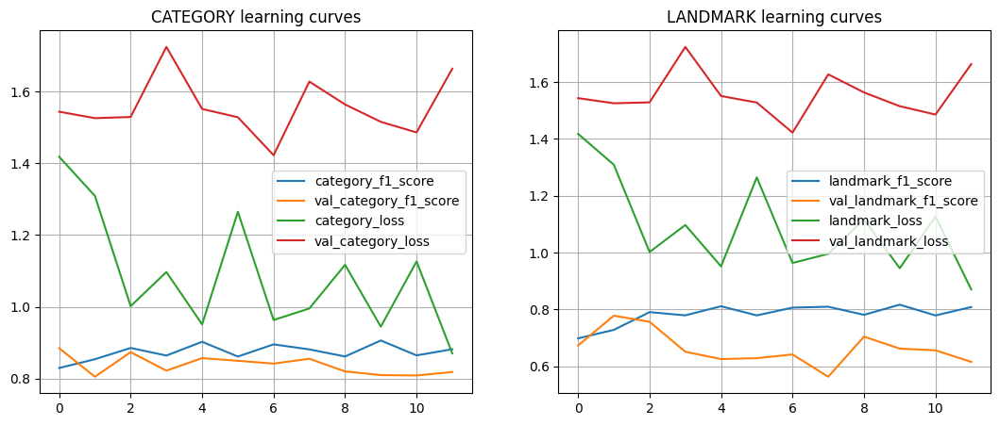

time: 616 ms (started: 2024-05-05 20:41:45 +00:00)


In [45]:
H = history.history
fig = plt.figure(figsize = (13, 5))

for i, c in enumerate(('category', 'landmark')):
    plt.subplot(1,2, i+1)
    plt.plot(np.array(H[f'{c}_f1_score']).mean(axis=1), label = f'{c}_f1_score')
    plt.plot(np.array(H[f'val_{c}_f1_score']).mean(axis=1), label = f'val_{c}_f1_score')
    plt.plot(H[f'loss'], label = f'{c}_loss')
    plt.plot(H[f'val_loss'], label = f'val_{c}_loss')
    plt.title(f'{c.upper()} learning curves')
    plt.legend()
    plt.grid()

In [46]:
print(H.keys())

dict_keys(['category_f1_score', 'landmark_f1_score', 'loss', 'val_category_f1_score', 'val_landmark_f1_score', 'val_loss'])
time: 420 µs (started: 2024-05-05 20:41:48 +00:00)


# **MODEL PERFORMANCE ON TEST DATA**

In [58]:
from tensorflow.keras.models import load_model

# Load the best model saved by ModelCheckpoint
best_model = load_model('saved_model/cat_land_best_model_f1_score.keras')

time: 1.81 s (started: 2024-05-05 23:32:27 +00:00)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


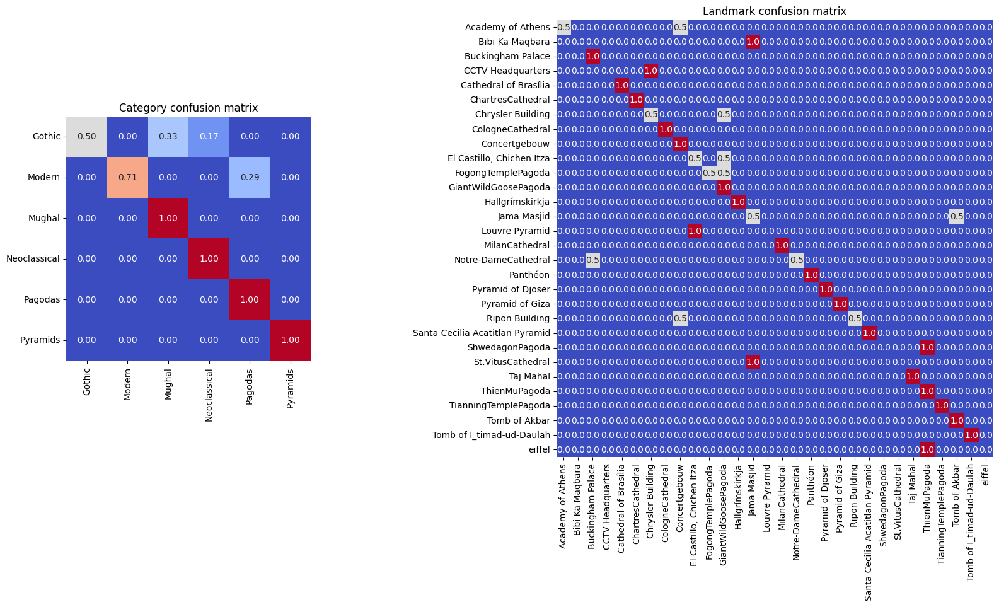

time: 2.63 s (started: 2024-05-05 23:35:28 +00:00)


In [66]:
cat_preds, land_preds = model.predict(test_x)

cat_confusion = confusion_matrix(
    np.argmax(cat_y_test, axis = 1), 
    np.argmax(cat_preds, axis = 1)
)
cat_confusion = cat_confusion / cat_confusion.sum(axis=1)[:, np.newaxis]

land_confusion = confusion_matrix(
    np.argmax(land_y_test, axis = 1), 
    np.argmax(land_preds, axis = 1)
)
land_confusion = land_confusion / land_confusion.sum(axis=1)[:, np.newaxis]

# Plotting confusion matrices
fig = plt.subplots(1,2,figsize=(22,9), gridspec_kw={'width_ratios': [1, 3]})

# Category confusion matrix plot
plt.subplot(121)
cat_l = list(lb_category.classes_)
sns.heatmap(
    cat_confusion, square = True, annot = True, fmt = '.2f', cbar = False, 
    xticklabels = cat_l, yticklabels = cat_l, cmap = 'coolwarm'
).set_title('Category confusion matrix')

# Color confusion matrix plot
plt.subplot(122)
land_l = list(lb_landmark.classes_)
sns.heatmap(
    land_confusion, square = True, annot = True, fmt = '.1f', cbar = False, 
    xticklabels = land_l, yticklabels = land_l, cmap = 'coolwarm'
).set_title('Landmark confusion matrix')

plt.show()

In [67]:
print("Classification report for Category")
print(
    classification_report(
        np.argmax(cat_y_test, axis = 1), 
        np.argmax(cat_preds, axis = 1)
    )
)

print("Classification report for Landmarks")
print(
    classification_report(
        np.argmax(land_y_test, axis = 1), 
        np.argmax(land_preds, axis = 1)
    )
)

Classification report for Category
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         6
           1       1.00      0.71      0.83         7
           2       0.75      1.00      0.86         6
           3       0.88      1.00      0.93         7
           4       0.80      1.00      0.89         8
           5       1.00      1.00      1.00         8

    accuracy                           0.88        42
   macro avg       0.90      0.87      0.86        42
weighted avg       0.91      0.88      0.87        42

Classification report for Landmarks
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         2
           1       0.00      0.00      0.00         1
           2       0.50      1.00      0.67         1
           3       0.00      0.00      0.00         1
           4       1.00      1.00      1.00         2
           5       1.00      1.00      1.00         1
       

In [68]:
best_model.evaluate(test_dataset)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - category_f1_score: 0.8865 - landmark_f1_score: 0.4855 - loss: 1.7856


[1.8188802003860474,
 <tf.Tensor: shape=(6,), dtype=float32, numpy=
 array([0.9090909 , 0.8333333 , 1.        , 0.87499994, 0.8421052 ,
        0.8571428 ], dtype=float32)>,
 <tf.Tensor: shape=(30,), dtype=float32, numpy=
 array([0.        , 0.        , 0.        , 0.9999998 , 1.        ,
        0.9999998 , 0.        , 0.66666657, 0.66666657, 0.        ,
        0.49999994, 0.        , 0.9999998 , 0.66666657, 0.        ,
        0.9999998 , 0.66666657, 0.2222222 , 0.66666657, 0.9999998 ,
        0.39999995, 1.        , 0.9999998 , 0.        , 0.        ,
        0.66666657, 1.        , 0.66666657, 0.66666657, 0.        ],
       dtype=float32)>]

time: 151 ms (started: 2024-05-05 23:35:48 +00:00)


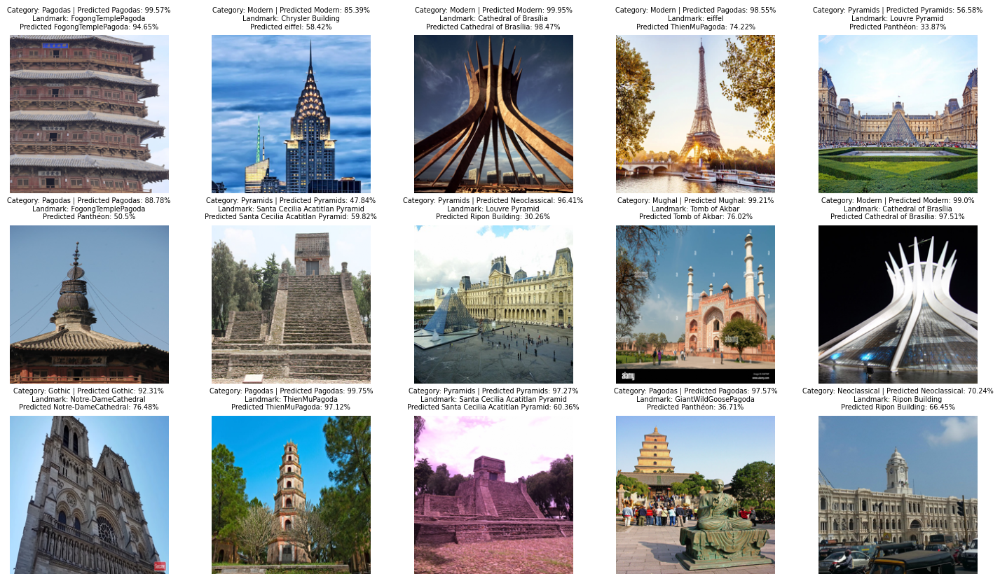

time: 2.84 s (started: 2024-05-05 23:37:38 +00:00)


In [71]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 10))
for images, labels in test_dataset.take(1):
    for i in range(15):
        ax = plt.subplot(3, 5, i + 1)
        image = images[i].numpy()
        plt.imshow(image)
        
        resized = cv2.resize(image, (INPUT_SHAPE[1], INPUT_SHAPE[0]))
        resized = image.reshape(-1, INPUT_SHAPE[1], INPUT_SHAPE[0], INPUT_SHAPE[2])
        
        # Predict results
        preds_cat, preds_land = best_model.predict(resized, verbose=0)
        preds_cat = (lb_category.classes_[np.argmax(preds_cat[0])], round(preds_cat[0].max() * 100, 2))
        preds_land = (lb_landmark.classes_[np.argmax(preds_land[0])], round(preds_land[0].max() * 100, 2))
        
        cat_ = lb_category.classes_[np.argmax(labels["category"][i])]
        land_ = lb_landmark.classes_[np.argmax(labels["landmark"][i])]
        
        # Update predicted category if actual category != predicted category but actual landmark = predicted landmark
#         if cat_ != preds_cat[0] and land_ == preds_land[0]:
#             preds_cat = (cat_, 100)  # Update predicted category to actual category
        
        plt.title(
            f"""Category: {cat_} | Predicted {preds_cat[0]}: {preds_cat[1]}%\nLandmark: {land_}\nPredicted {preds_land[0]}: {preds_land[1]}%""",
            fontdict={"fontsize":7})
        plt.axis("off")

# **MODEL PERFORMANCE ON DATASET CREATED BY US (GROUP 13) - SOURCE: GOOGLE**

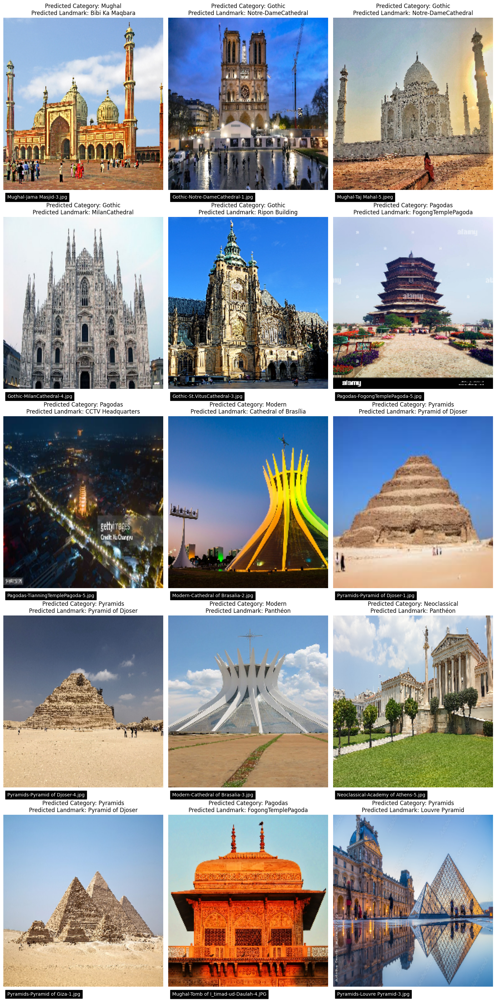

time: 5.69 s (started: 2024-05-05 23:36:10 +00:00)


In [70]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Path to the folder containing images
random_test_data_folder = "/kaggle/input/random-test-data/Random_Test_Data"

# Get a list of image file paths
image_paths = [os.path.join(random_test_data_folder, file) for file in os.listdir(random_test_data_folder)]

# Select 15 random images
random_image_paths = random.sample(image_paths, 15)

# Define the figure size to increase height
plt.figure(figsize=(15, 30))  # Increase the height here

num_images = len(random_image_paths)
num_cols = min(num_images, 3)
num_rows = (num_images // 3) + (1 if num_images % 3 != 0 else 0)

# Adjust the spacing between subplots
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.05, hspace=0.45)

for i, image_path in enumerate(random_image_paths):
    ax = plt.subplot(num_rows, num_cols, i + 1)
    
    # Read and resize the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    resized_image = cv2.resize(image, (224, 224))  # Resize to 224x224
    plt.imshow(resized_image)
    
    # Print the image name as annotation
    image_name = os.path.basename(image_path)
    plt.text(5, 235, image_name, color='white', backgroundcolor='black', fontsize=10)
    
    # Preprocess the resized image for prediction
    resized_image = np.expand_dims(resized_image, axis=0)
    resized_image = resized_image / 255.0  # Normalize pixel values
    
    # Predict results using the best model
    preds_cat, preds_land = best_model.predict(resized_image, verbose=0)
    preds_cat = 
    .classes_[np.argmax(preds_cat[0])]
    preds_land = lb_landmark.classes_[np.argmax(preds_land[0])]
    
    plt.title(f"Predicted Category: {preds_cat}\nPredicted Landmark: {preds_land}", fontdict={"fontsize": 12})
    plt.axis("off")
    ax.set_aspect('auto')

plt.tight_layout()
plt.show()


# **You can try different approaches with training parameters (Hyperparameter Tuning) - For Example Increasing/Decreasing Epochs, Monitoring method change, ensemble methods etc**

# **Thank You**